In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
# from price_ai.model.bivariate_demand_curve_blr import BivariateDemandCurveBLR
# from price_ai.enums.exploration_enum import ExplorationMethod

In [ ]:
from enum import Enum


class ExplorationMethod(str, Enum):
    """
    Enum for exploration methods used to sample the demand curve
    """

    THOMPSON = "thompson"
    UCB1 = "ucb1"
    LCB = "lcb"
    MEDIAN = "median"
    GPUCB = "GP-UCB"
    MEAN = "mean"

In [7]:
class Environment:
    def __init__(self):
        self.scale = 1
        np.random.seed(42)

    def demand(self, x: np.ndarray) -> np.ndarray:
        return self.scale * np.exp(-((2 * x) ** 2))

    def objective_function(
        self, x: np.ndarray, y: np.ndarray, ly_x=0, lx_y=0
    ) -> np.ndarray:
        return x * self.demand_x(x, y, ly_x) + y * self.demand_x(y, x, lx_y)

    def demand_x(self, x: np.ndarray, y: np.ndarray, l=0) -> np.ndarray:
        return self.demand(x) + l * self.demand(y)

    def sample(self, X, noise=True):
        # Adding noise to the objective function
        if noise:
            noise = np.random.normal(0, self.scale * 0.1, X[0].shape)
        else:
            noise = 0
        return self.objective_function(X[0], X[1]) + noise

    def sample_demand_x(self, X, noise=True, l=0):
        # Adding noise to the objective function
        if noise:
            noise = np.random.normal(0, self.scale * 0.1, X[0].shape)
        else:
            noise = 0
        return self.demand_x(X[0], X[1], l=l) + noise

In [8]:
env = Environment()

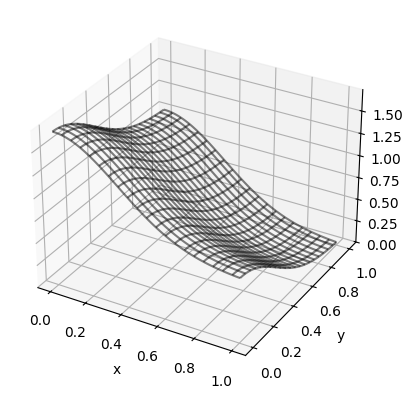

In [9]:
# Plot of the objective function
x = np.linspace(0, 1, 100)
y = np.linspace(0, 1, 100)
X, Y = np.meshgrid(x, y)
# Z = env.objective_function(X, Y, ly_x=0.7, lx_y=0.5)
Z = env.demand_x(X, Y, l=0.7)
ax = plt.axes(projection="3d")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.plot_wireframe(X, Y, Z, color="black", alpha=0.5, rstride=5, cstride=5)
plt.savefig("monotonic_bivariate_volume.png", transparent=True)
plt.show()

In [10]:
from price_ai.model.bivariate_demand_curve_blr import BivariateDemandCurveBLR

ModuleNotFoundError: No module named 'price_ai'

In [11]:
bivariate_hyperparameters_dict = {
    "epochs": 500,
    "save_every": 2,
    "exploration_method": "UCB",
    "prior": [
        ("lognormal", {"scale": 10.0, "loc": 1000.0}),
        ("lognormal", {"scale": 1000.0, "loc": 0.0}),
    ],
    "posterior": [
        ("lognormal", {"loc": 0.0}),  # Bias
        ("lognormal", {"loc": 0.0}),  # First and last polynomials
    ],
    "mask": [
        [0, 11],
        [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21],
    ],
    "minimum_margin": [0, 0],
    "maximum_margin": [1, 1],
    "bern_degree": 10,
    "compile_args": {"learning_rate": 1e-2, "loss": "mse", "metrics": ["mae"]},
    "fit_args": {"epochs": 500, "verbose": False},
    "random_state": 42,
}

In [ ]:
EPOCHS = bivariate_hyperparameters_dict["epochs"]
SAVE_EVERY = bivariate_hyperparameters_dict["save_every"]

dict_bivariate_model_args = {
    "prior": bivariate_hyperparameters_dict["prior"],
    "posterior": bivariate_hyperparameters_dict["posterior"],
    "mask": bivariate_hyperparameters_dict["mask"],
    "minimum_margin": np.asarray(bivariate_hyperparameters_dict["minimum_margin"]),
    "maximum_margin": np.asarray(bivariate_hyperparameters_dict["maximum_margin"]),
    "bern_degree": bivariate_hyperparameters_dict["bern_degree"],
    "compile_args": {
        "optimizer": tf.keras.optimizers.Adam(
            learning_rate=bivariate_hyperparameters_dict["compile_args"][
                "learning_rate"
            ]
        ),
        "loss": bivariate_hyperparameters_dict["compile_args"]["loss"],
        "metrics": bivariate_hyperparameters_dict["compile_args"]["metrics"],
    },
    "fit_args": bivariate_hyperparameters_dict["fit_args"],
    "random_state": bivariate_hyperparameters_dict["random_state"],
}

if bivariate_hyperparameters_dict["exploration_method"] == "UCB":
    exploration_method = ExplorationMethod.UCB1
elif bivariate_hyperparameters_dict["exploration_method"] == "THOMPSON":
    exploration_method = ExplorationMethod = ExplorationMethod.THOMPSON
else:
    raise ValueError("Invalid exploration method")

## Bivariate model 1

In [73]:
# Sample from the environment 100 times and obtain a pair of margins and the corresponding demand
X = np.random.uniform(0, 1, (100, 2))
y = []
for x in X:
    y.append(env.demand_x(x[0], x[1], l=0.7))
y = np.asarray(y).reshape(-1, 1)

In [74]:
bivariate_model_1 = BivariateDemandCurveBLR(**dict_bivariate_model_args)
bivariate_model_1.fit(X, y)

Creating new model


In [ ]:
X1_sample, X2_sample = bivariate_model_1.get_sample_margins()
demand_curve_matrix = bivariate_model_1.get_demand_curve(
    X1_sample, X2_sample, ExplorationMethod.MEDIAN
)

In [6]:
X, Y = np.meshgrid(X1_sample, X2_sample, indexing="ij")
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")
ax.plot_surface(
    X, Y, demand_curve_matrix, rstride=1, cstride=1, cmap="jet", edgecolor="none"
)
ax.set_xlabel("X1")
ax.set_ylabel("X2")
ax.set_zlabel("Objective function")
plt.show()

NameError: name 'X1_sample' is not defined

## Bivariate model 2

In [77]:
# Sample from the environment 100 times and obtain a pair of margins and the corresponding demand
X = np.random.uniform(0, 1, (100, 2))
y = []
for x in X:
    y.append(env.demand_x(x[0], x[1], l=0.2))
y = np.asarray(y).reshape(-1, 1)

In [78]:
bivariate_model_2 = BivariateDemandCurveBLR(**dict_bivariate_model_args)
bivariate_model_2.fit(X, y)

Creating new model


In [ ]:
X1_sample, X2_sample = bivariate_model_2.get_sample_margins()
demand_curve_matrix = bivariate_model_2.get_demand_curve(
    X1_sample, X2_sample, ExplorationMethod.MEDIAN
)

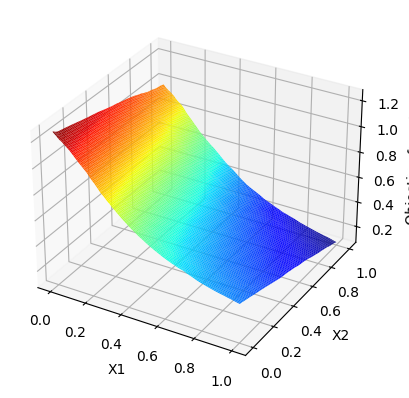

In [ ]:
X, Y = np.meshgrid(X1_sample, X2_sample, indexing="ij")
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")
ax.plot_surface(
    X, Y, demand_curve_matrix, rstride=1, cstride=1, cmap="jet", edgecolor="none"
)
ax.set_xlabel("X1")
ax.set_ylabel("X2")
ax.set_zlabel("Objective function")
plt.show()

# Objective function
The objective funciton is the following:
margin_1 * bivariate_model_1(margin_1, margin_2) + margin_2 * bivariate_model_2(margin_1, margin_2)

In [ ]:
from price_ai.model.bivariate_objective_function_monotonic_blr import (
    BivariateObjectiveFunctionMonotonicBLR,
)

In [ ]:
obj_fun_model = BivariateObjectiveFunctionMonotonicBLR(
    [bivariate_model_1, bivariate_model_2]
)

In [ ]:
obj_fun = obj_fun_model.get_objective_function(
    X1_sample, X2_sample, ExplorationMethod.UCB1
)

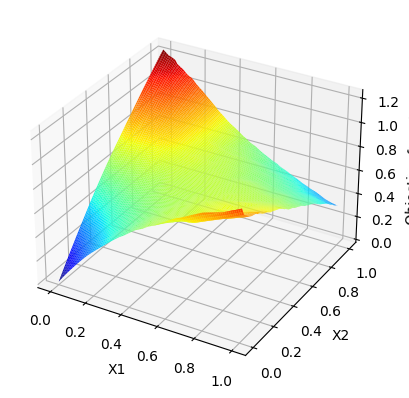

In [ ]:
X, Y = np.meshgrid(X1_sample, X2_sample, indexing="ij")
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")
ax.plot_surface(X, Y, obj_fun, rstride=1, cstride=1, cmap="jet", edgecolor="none")
ax.set_xlabel("X1")
ax.set_ylabel("X2")
ax.set_zlabel("Objective function")
plt.show()

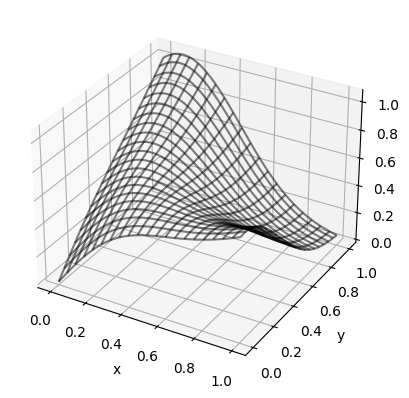

In [ ]:
# Plot of the objective function
x = np.linspace(0, 1, 100)
y = np.linspace(0, 1, 100)
X, Y = np.meshgrid(x, y)
Z1 = env.demand_x(X, Y, l=0.7)
Z2 = env.demand_x(X, Y, l=0.2)
Z = X * Z1 + Y * Z2
ax = plt.axes(projection="3d")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.plot_wireframe(X, Y, Z, color="black", alpha=0.5, rstride=5, cstride=5)
plt.savefig("monotonic_bivariate_volume.png", transparent=True)

In [87]:
max(Z.flatten())

1.0626618823836365

# Online learning simulation

In [ ]:
from price_ai.margin_optimization.bivariate_margin_optimizer import (
    BivariateMarginOptimizer,
)

# margins_1 = np.random.uniform(0, 1, 1).reshape(-1, 1)
# margins_2 = np.random.uniform(0, 1, 1).reshape(-1, 1)
margins_1 = np.asarray([0.61821806]).reshape(-1, 1)
margins_2 = np.asarray([0.10112268]).reshape(-1, 1)
margins = np.concatenate([margins_1, margins_2], axis=1)
volumes_1 = env.demand_x(margins_1, margins_2, l=0.7)
volumes_2 = env.demand_x(margins_1, margins_2, l=0.2)
bivariate_optimizer = BivariateMarginOptimizer()
profits = []

print(margins)
print(volumes_1, volumes_2)

[[0.61821806 0.10112268]]
[[0.88874668]] [[0.40878565]]


In [ ]:
# Train the model
for i in range(1, EPOCHS + 1):
    print(f"Epoch {i}/{EPOCHS}")

    demand_curve_1 = BivariateDemandCurveBLR(**dict_bivariate_model_args)
    demand_curve_1.fit(margins, volumes_1)
    demand_curve_2 = BivariateDemandCurveBLR(**dict_bivariate_model_args)
    demand_curve_2.fit(margins, volumes_2)

    objective_function = BivariateObjectiveFunctionMonotonicBLR(
        [demand_curve_1, demand_curve_2]
    )

    margin_1, margin_2 = bivariate_optimizer.get_optimal_margin(
        objective_function,
        exploration_method,
        100,
    )

    margin_1 = margin_1.reshape(-1, 1)
    margin_2 = margin_2.reshape(-1, 1)

    volume_1 = env.demand_x(margin_1, margin_2, l=0.7)
    volume_2 = env.demand_x(margin_1, margin_2, l=0.2)

    volumes_1 = np.concatenate([volumes_1, volume_1], axis=0)
    volumes_2 = np.concatenate([volumes_2, volume_2], axis=0)

    margins_1 = np.concatenate([margins_1, margin_1], axis=0)
    margins_2 = np.concatenate([margins_2, margin_2], axis=0)
    margins = np.concatenate([margins_1, margins_2], axis=1)

    print(margins)
    print(volumes_1, volumes_2)
    profit = margin_1 * volume_1 + margin_2 * volume_2
    profits.append(profit)
    print(profits)

Epoch 1/500
Creating new model
Creating new model
[[0.61821806 0.10112268]
 [0.         1.        ]]
[[0.88874668]
 [1.01282095]] [[0.40878565]
 [1.00366313]]
[array([[1.00366313]])]
Epoch 2/500
Creating new model
Creating new model
[[0.61821806 0.10112268]
 [0.         1.        ]
 [1.         1.        ]]
[[0.88874668]
 [1.01282095]
 [0.03113659]] [[0.40878565]
 [1.00366313]
 [0.02197877]]
[array([[1.00366313]]), array([[0.05311535]])]
Epoch 3/500
Creating new model
Creating new model
[[0.61821806 0.10112268]
 [0.         1.        ]
 [1.         1.        ]
 [0.01010101 1.        ]]
[[0.88874668]
 [1.01282095]
 [0.03113659]
 [1.01241291]] [[0.40878565]
 [1.00366313]
 [0.02197877]
 [1.00325509]]
[array([[1.00366313]]), array([[0.05311535]]), array([[1.01348148]])]
Epoch 4/500
Creating new model
Creating new model
[[0.61821806 0.10112268]
 [0.         1.        ]
 [1.         1.        ]
 [0.01010101 1.        ]
 [0.01010101 1.        ]]
[[0.88874668]
 [1.01282095]
 [0.03113659]
 [1.0

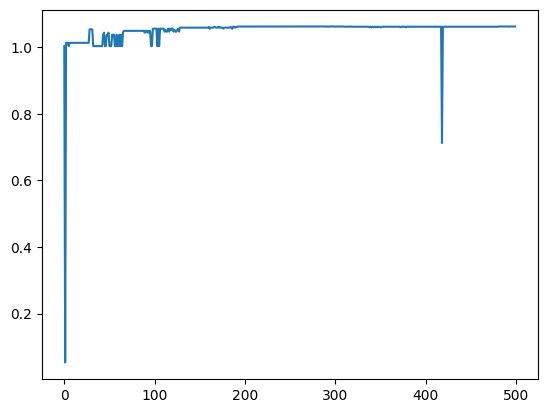

In [91]:
profits = np.asarray(profits).reshape(-1, 1)
plt.plot(profits)